In [ ]:
!pip install cellpose --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.0/211.0 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 112.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
# !unzip Fluo-Structured-2.zip  #--quiet
!unzip Fluo-N2DL-HeLa_test.zip  #--quiet

Archive:  Fluo-N2DL-HeLa_test.zip
   creating: Fluo-N2DL-HeLa/
   creating: Fluo-N2DL-HeLa/01/
  inflating: Fluo-N2DL-HeLa/01/t000.tif  
  inflating: Fluo-N2DL-HeLa/01/t001.tif  
  inflating: Fluo-N2DL-HeLa/01/t002.tif  
  inflating: Fluo-N2DL-HeLa/01/t003.tif  
  inflating: Fluo-N2DL-HeLa/01/t004.tif  
  inflating: Fluo-N2DL-HeLa/01/t005.tif  
  inflating: Fluo-N2DL-HeLa/01/t006.tif  
  inflating: Fluo-N2DL-HeLa/01/t007.tif  
  inflating: Fluo-N2DL-HeLa/01/t008.tif  
  inflating: Fluo-N2DL-HeLa/01/t009.tif  
  inflating: Fluo-N2DL-HeLa/01/t010.tif  
  inflating: Fluo-N2DL-HeLa/01/t011.tif  
  inflating: Fluo-N2DL-HeLa/01/t012.tif  
  inflating: Fluo-N2DL-HeLa/01/t013.tif  
  inflating: Fluo-N2DL-HeLa/01/t014.tif  
  inflating: Fluo-N2DL-HeLa/01/t015.tif  
  inflating: Fluo-N2DL-HeLa/01/t016.tif  
  inflating: Fluo-N2DL-HeLa/01/t017.tif  
  inflating: Fluo-N2DL-HeLa/01/t018.tif  
  inflating: Fluo-N2DL-HeLa/01/t019.tif  
  inflating: Fluo-N2DL-HeLa/01/t020.tif  
  inflating: Fluo-N2DL-

In [ ]:
# import shutil
# import os
# from tqdm import tqdm
# from glob import glob

# os.makedirs("train_data",exist_ok=True)
# train_data = []
# for folder in ["images","masks"]:
#   os.makedirs(f"train_data/{folder}/",exist_ok=True)

#   for subset in ["train","val"]:
#     for path in tqdm(glob(f"Fluo-Structured-2/{folder}/{subset}/*"), desc=f"{folder}, {subset}"):
#       train_data.append(path)
#       shutil.copy(path,f"train_data/{folder}/")

In [ ]:
from cellpose import models, io
import os
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import cv2

# Path to folder containing the Fluo-N2DL-HeLa image sequence
# image_folder = 'train_data'
# image_files = sorted(glob(os.path.join(image_folder,"images", '*.tif')))
image_folder = 'Fluo-N2DL-HeLa'
image_files = sorted(glob(os.path.join(image_folder,"01", '*.tif')))


print(image_files)
# Load Cellpose model (nuclei mode works well for HeLa cells)
# model = models.Cellpose(gpu=False, model_type='nuclei')
model = models.CellposeModel(gpu=True, model_type='nuclei')

# Create output folder
# output_mask_dir = os.path.join(image_folder, 'masks')
output_mask_dir = 'out_masks'
os.makedirs(output_mask_dir, exist_ok=True)

# Iterate over each frame and segment
for i, img_path in enumerate(image_files):
    img = io.imread(img_path)

    # masks, flows, styles, diams = model.eval(img, channels=[0,0])
    masks, flows, styles = model.eval(img, channels=[0, 0])
    # diameter = model.diam_mean
    # Save mask
    mask_path = os.path.join(output_mask_dir, f'mask_{i:03d}.npy')
    np.save(mask_path, masks)

    # Optional: Save visualization
    mask_vis = (masks.astype(np.uint8) * 10).clip(0, 255)
    vis_path = os.path.join(output_mask_dir, f'mask_vis_{i:03d}.png')
    cv2.imwrite(vis_path, mask_vis)

    print(f"Processed frame {i+1}/{len(image_files)}")




Welcome to CellposeSAM, cellpose v
cellpose version: 	4.0.4 
platform:       	linux 
python version: 	3.11.13 
torch version:  	2.6.0+cu124! The neural network component of
CPSAM is much larger than in previous versions and CPU excution is slow. 
We encourage users to use GPU/MPS if available. 




['Fluo-N2DL-HeLa/01/t000.tif', 'Fluo-N2DL-HeLa/01/t001.tif', 'Fluo-N2DL-HeLa/01/t002.tif', 'Fluo-N2DL-HeLa/01/t003.tif', 'Fluo-N2DL-HeLa/01/t004.tif', 'Fluo-N2DL-HeLa/01/t005.tif', 'Fluo-N2DL-HeLa/01/t006.tif', 'Fluo-N2DL-HeLa/01/t007.tif', 'Fluo-N2DL-HeLa/01/t008.tif', 'Fluo-N2DL-HeLa/01/t009.tif', 'Fluo-N2DL-HeLa/01/t010.tif', 'Fluo-N2DL-HeLa/01/t011.tif', 'Fluo-N2DL-HeLa/01/t012.tif', 'Fluo-N2DL-HeLa/01/t013.tif', 'Fluo-N2DL-HeLa/01/t014.tif', 'Fluo-N2DL-HeLa/01/t015.tif', 'Fluo-N2DL-HeLa/01/t016.tif', 'Fluo-N2DL-HeLa/01/t017.tif', 'Fluo-N2DL-HeLa/01/t018.tif', 'Fluo-N2DL-HeLa/01/t019.tif', 'Fluo-N2DL-HeLa/01/t020.tif', 'Fluo-N2DL-HeLa/01/t021.tif', 'Fluo-N2DL-HeLa/01/t022.tif', 'Fluo-N2DL-HeLa/01/t023.tif', 'Fluo-N2DL-HeLa/01/t024.tif', 'Fluo-N2DL-HeLa/01/t025.tif', 'Fluo-N2DL-HeLa/01/t026.tif', 'Fluo-N2DL-HeLa/01/t027.tif', 'Fluo-N2DL-HeLa/01/t028.tif', 'Fluo-N2DL-HeLa/01/t029.tif', 'Fluo-N2DL-HeLa/01/t030.tif', 'Fluo-N2DL-HeLa/01/t031.tif', 'Fluo-N2DL-HeLa/01/t032.tif', 'Fluo-N2D

100%|██████████| 1.15G/1.15G [00:04<00:00, 262MB/s]


Processed frame 1/92


Processed frame 2/92


Processed frame 3/92


Processed frame 4/92


Processed frame 5/92


Processed frame 6/92


Processed frame 7/92


Processed frame 8/92


Processed frame 9/92


Processed frame 10/92


Processed frame 11/92


Processed frame 12/92


Processed frame 13/92


Processed frame 14/92


Processed frame 15/92


Processed frame 16/92


Processed frame 17/92


Processed frame 18/92


Processed frame 19/92


Processed frame 20/92


Processed frame 21/92


Processed frame 22/92


Processed frame 23/92


Processed frame 24/92


Processed frame 25/92


Processed frame 26/92


Processed frame 27/92


Processed frame 28/92


Processed frame 29/92


Processed frame 30/92


Processed frame 31/92


Processed frame 32/92


Processed frame 33/92


Processed frame 34/92


Processed frame 35/92


Processed frame 36/92


Processed frame 37/92


Processed frame 38/92


Processed frame 39/92


Processed frame 40/92


Processed frame 41/92


Processed frame 42/92


Processed frame 43/92


Processed frame 44/92


Processed frame 45/92


Processed frame 46/92


Processed frame 47/92


Processed frame 48/92


Processed frame 49/92


Processed frame 50/92


Processed frame 51/92


Processed frame 52/92


Processed frame 53/92


Processed frame 54/92


Processed frame 55/92


Processed frame 56/92


Processed frame 57/92


Processed frame 58/92


Processed frame 59/92


Processed frame 60/92


Processed frame 61/92


Processed frame 62/92


Processed frame 63/92


Processed frame 64/92


Processed frame 65/92


Processed frame 66/92


Processed frame 67/92


Processed frame 68/92


Processed frame 69/92


Processed frame 70/92


Processed frame 71/92


Processed frame 72/92


Processed frame 73/92


Processed frame 74/92


Processed frame 75/92


Processed frame 76/92


Processed frame 77/92


Processed frame 78/92


Processed frame 79/92


Processed frame 80/92


Processed frame 81/92


Processed frame 82/92


Processed frame 83/92


Processed frame 84/92


Processed frame 85/92


Processed frame 86/92


Processed frame 87/92


Processed frame 88/92


Processed frame 89/92


Processed frame 90/92


Processed frame 91/92
Processed frame 92/92


In [ ]:
import numpy as np
import os
from scipy.optimize import linear_sum_assignment
from skimage.measure import regionprops
from scipy.spatial.distance import cdist

def iou(bb1, bb2):
    """Compute IoU between two bounding boxes"""
    x1 = max(bb1[0], bb2[0])
    y1 = max(bb1[1], bb2[1])
    x2 = min(bb1[2], bb2[2])
    y2 = min(bb1[3], bb2[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
    bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

    return inter_area / float(bb1_area + bb2_area - inter_area + 1e-6)

def compute_bbox(mask):
    props = regionprops(mask)
    return [prop.bbox for prop in props], [prop.centroid for prop in props]

def mask_to_objects(mask):
    props = regionprops(mask)
    return [
        {'id': None, 'label': prop.label, 'centroid': prop.centroid, 'bbox': prop.bbox, 'area': prop.area}
        for prop in props
    ]

def track_cells(mask_list, iou_threshold=0.3):
    next_id = 1
    tracks = {}  # {id: [{frame, centroid, area}]}

    prev_objects = []

    for t, mask in enumerate(mask_list):
        curr_objects = mask_to_objects(mask)

        if t == 0:
            for obj in curr_objects:
                obj['id'] = next_id
                tracks[next_id] = [{'frame': t, **obj}]
                next_id += 1
        else:
            cost_matrix = np.ones((len(prev_objects), len(curr_objects))) * np.inf

            for i, prev in enumerate(prev_objects):
                for j, curr in enumerate(curr_objects):
                    cost_matrix[i, j] = 1 - iou(prev['bbox'], curr['bbox'])

            row_ind, col_ind = linear_sum_assignment(cost_matrix)

            assigned = set()
            for i, j in zip(row_ind, col_ind):
                if cost_matrix[i, j] < (1 - iou_threshold):
                    curr_objects[j]['id'] = prev_objects[i]['id']
                    tracks[prev_objects[i]['id']].append({'frame': t, **curr_objects[j]})
                    assigned.add(j)

            for j, curr in enumerate(curr_objects):
                if j not in assigned:
                    curr['id'] = next_id
                    tracks[next_id] = [{'frame': t, **curr}]
                    next_id += 1

        prev_objects = curr_objects

    return tracks


In [ ]:
import numpy as np
import os
# from cell_tracker import track_cells


# Load all mask frames
mask_folder = 'out_masks'
mask_files = sorted([f for f in os.listdir(mask_folder) if f.endswith('.npy')])
masks = [np.load(os.path.join(mask_folder, f)) for f in mask_files]

tracks = track_cells(masks)

# Each track is a dictionary: ID → list of detections over time
print(f"Tracked {len(tracks)} unique cells.")


Tracked 648 unique cells.


In [ ]:
import numpy as np

def extract_features_from_tracks(tracks, pixel_size=1.0, frame_interval=1.0):
    feature_table = []

    for track_id, detections in tracks.items():
        sizes = [d['area'] for d in detections]
        centroids = np.array([d['centroid'] for d in detections])

        speeds = []
        for i in range(1, len(centroids)):
            dist = np.linalg.norm(np.array(centroids[i]) - np.array(centroids[i-1]))
            speed = (dist * pixel_size) / frame_interval
            speeds.append(speed)

        total_distance = np.sum(speeds) * frame_interval if speeds else 0

        feature_table.append({
            'id': track_id,
            'frames': [d['frame'] for d in detections],
            'mean_size': np.mean(sizes),
            'max_size': np.max(sizes),
            'min_size': np.min(sizes),
            'mean_speed': np.mean(speeds) if speeds else 0,
            'max_speed': np.max(speeds) if speeds else 0,
            'min_speed': np.min(speeds) if speeds else 0,
            'total_distance': total_distance
        })

    return feature_table


In [ ]:
features = extract_features_from_tracks(tracks)

# Print a few examples
for f in features[:5]:
    print(f)


{'id': 1, 'frames': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 'mean_size': np.float64(247.63636363636363), 'max_size': np.float64(356.0), 'min_size': np.float64(117.0), 'mean_speed': np.float64(2.238345983947392), 'max_speed': np.float64(4.3851516971012465), 'min_speed': np.float64(0.6693313681929577), 'total_distance': np.float64(22.383459839473918)}
{'id': 2, 'frames': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74], 'mean_size': np.float64(398.94666666666666), 'max_size': np.float64(706.0), 'min_size': np.float64(112.0), 'mean_speed': np.float64(1.202444542736611), 'max_speed': np.float64(2.6475775009445583), 'min_speed': np.float64(0.17046835241707664), 'total_distance': np.float64(88.98089616250921)}
{'id': 3, 'frames': [0, 1, 2, 3, 4, 5, 6, 7], 'm

In [ ]:
import pandas as pd

def save_features_to_csv(features, filename="cell_features.csv"):
    df = pd.DataFrame(features)
    df.to_csv(filename, index=False)
    print(f"[✔] Cell features saved to: {filename}")

# Step 1: Extract features
features = extract_features_from_tracks(tracks)

# Step 2: Save to CSV
save_features_to_csv(features, "cell_features.csv")

[✔] Cell features saved to: cell_features.csv


In [ ]:
def detect_mitosis(tracks, distance_threshold=20):
    mitosis_events = []

    track_endings = {}
    track_beginnings = {}

    for tid, dets in tracks.items():
        track_endings[tid] = dets[-1]
        track_beginnings[tid] = dets[0]

    for mother_id, end_det in track_endings.items():
        frame_end = end_det['frame']
        end_centroid = np.array(end_det['centroid'])

        # Find candidates starting in the next frame
        daughters = []
        for cand_id, start_det in track_beginnings.items():
            if cand_id == mother_id:
                continue
            if start_det['frame'] == frame_end + 1:
                dist = np.linalg.norm(end_centroid - np.array(start_det['centroid']))
                if dist < distance_threshold:
                    daughters.append((cand_id, dist))

        if len(daughters) >= 2:
            mitosis_events.append({
                'mother_id': mother_id,
                'frame': frame_end,
                'daughter_ids': [d[0] for d in daughters[:2]]
            })

    return mitosis_events


In [ ]:
mitosis = detect_mitosis(tracks)
print(f"Detected {len(mitosis)} mitosis events.")


Detected 44 mitosis events.


In [ ]:
# import os
# import cv2
# import numpy as np
# from matplotlib import cm

# def save_labeled_masks(tracks, shape, save_dir='labeled_masks'):
#     os.makedirs(save_dir, exist_ok=True)
#     cmap = cm.get_cmap('tab20', 256)  # colorful colormap

#     frame_tracks = {}
#     for tid, detections in tracks.items():
#         for det in detections:
#             f = det['frame']
#             if f not in frame_tracks:
#                 frame_tracks[f] = []
#             frame_tracks[f].append((tid, det['label']))

#     for f in sorted(frame_tracks.keys()):
#         frame_mask = np.zeros(shape, dtype=np.uint16)
#         for tid, label in frame_tracks[f]:
#             frame_mask[frame_mask == label] = tid  # assign unique track ID

#         colored = np.zeros((*shape, 3), dtype=np.uint8)
#         for tid in np.unique(frame_mask):
#             if tid == 0: continue
#             color = (np.array(cmap(tid % 256))[:3] * 255).astype(np.uint8)
#             colored[frame_mask == tid] = color

#         cv2.imwrite(os.path.join(save_dir, f"labeled_{f:03d}.png"), colored[:, :, ::-1])  # RGB → BGR
# from matplotlib import cm
# import numpy as np
# import cv2
# import os

# def save_labeled_masks(tracks, original_masks, save_dir='labeled_masks'):
#     os.makedirs(save_dir, exist_ok=True)
#     cmap = cm.get_cmap('tab20', 256)

#     # Create a reverse lookup: (frame, cell_label) → track_id
#     label_map = {}  # (frame, label) → track_id
#     for tid, dets in tracks.items():
#         for d in dets:
#             label_map[(d['frame'], d['label'])] = tid

#     for frame_idx, mask in enumerate(original_masks):
#         colored = np.zeros((*mask.shape, 3), dtype=np.uint8)

#         for label in np.unique(mask):
#             if label == 0:
#                 continue
#             key = (frame_idx, label)
#             if key in label_map:
#                 tid = label_map[key]
#                 color = (np.array(cmap(tid % 256)[:3]) * 255).astype(np.uint8)
#                 colored[mask == label] = color

#         out_path = os.path.join(save_dir, f"labeled_{frame_idx:03d}.png")
#         cv2.imwrite(out_path, colored[:, :, ::-1])  # RGB → BGR

#     print(f"[✔] Labeled images saved to {save_dir}")


import numpy as np
import cv2
import os
from matplotlib import cm
from skimage.measure import regionprops

def save_labeled_masks(tracks, original_masks, save_dir='labeled_masks_with_ids'):
    os.makedirs(save_dir, exist_ok=True)
    cmap = cm.get_cmap('tab20', 256)

    # Build label lookup: (frame, label) → track_id
    label_map = {}  # (frame, label) → track_id
    centroid_map = {}  # (frame, label) → centroid
    for tid, dets in tracks.items():
        for d in dets:
            label_map[(d['frame'], d['label'])] = tid
            centroid_map[(d['frame'], d['label'])] = d['centroid']

    for frame_idx, mask in enumerate(original_masks):
        h, w = mask.shape
        colored = np.zeros((h, w, 3), dtype=np.uint8)

        for label in np.unique(mask):
            if label == 0:
                continue

            key = (frame_idx, label)
            if key in label_map:
                tid = label_map[key]
                centroid = centroid_map[key]
                color = (np.array(cmap(tid % 256)[:3]) * 255).astype(np.uint8)

                # Color the mask
                colored[mask == label] = color

                # Draw the tracking ID as text
                cX, cY = int(centroid[1]), int(centroid[0])  # (row, col) → (x, y)
                cv2.putText(colored, str(tid), (cX, cY),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                            (255, 255, 255), 1, cv2.LINE_AA)

        out_path = os.path.join(save_dir, f"labeled_{frame_idx:03d}.png")
        cv2.imwrite(out_path, colored[:, :, ::-1])  # RGB → BGR

    print(f"[✔] Labeled masks with IDs saved to: {save_dir}")



In [ ]:
def create_video_from_images(image_dir, output_file="tracked_cells.mp4", fps=5):
    image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')])
    if not image_files:
        print("No images found.")
        return

    first_img = cv2.imread(os.path.join(image_dir, image_files[0]))
    h, w, _ = first_img.shape

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(output_file, fourcc, fps, (w, h))

    for file in image_files:
        img = cv2.imread(os.path.join(image_dir, file))
        video.write(img)

    video.release()
    print(f"[✔] Video saved as: {output_file}")


In [ ]:
# Example image shape (should match your original mask shape)
image_shape = masks[0].shape

# Step 1: Save labeled masks
# save_labeled_masks(tracks, shape=image_shape, save_dir='labeled_masks')
save_labeled_masks(tracks, original_masks=masks, save_dir="labeled_masks")

# Step 2: Convert labeled masks to video
create_video_from_images('labeled_masks', output_file='tracked_cells.mp4')

/tmp/ipython-input-14-357461214.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', 256)


[✔] Labeled masks with IDs saved to: labeled_masks
[✔] Video saved as: tracked_cells.mp4


In [ ]:
import matplotlib.pyplot as plt

def plot_trajectories(tracks):
    plt.figure(figsize=(8, 8))
    for tid, dets in tracks.items():
        xy = np.array([d['centroid'][::-1] for d in dets])  # (y,x) → (x,y)
        plt.plot(xy[:, 0], xy[:, 1], label=f'ID {tid}')
        plt.scatter(xy[0, 0], xy[0, 1], marker='o', s=30)  # start
        plt.scatter(xy[-1, 0], xy[-1, 1], marker='x', s=30)  # end
    plt.title("Cell Trajectories")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.grid()
    plt.show()


In [ ]:
import networkx as nx

def plot_mitosis_tree(mitosis_events):
    G = nx.DiGraph()
    for event in mitosis_events:
        mom = event['mother_id']
        for d in event['daughter_ids']:
            G.add_edge(mom, d)

    pos = nx.spring_layout(G)
    plt.figure(figsize=(6, 6))
    nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=1000, arrows=True)
    plt.title("Mitosis Lineage Tree")
    plt.show()


In [ ]:
from IPython.display import HTML
from base64 import b64encode

def display_video(video_path='tracked_cells.mp4'):
    mp4 = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML(f"""
    <video width=640 controls>
        <source src="{data_url}" type="video/mp4">
    </video>
    """)

In [ ]:
display_video('tracked_cells.mp4')

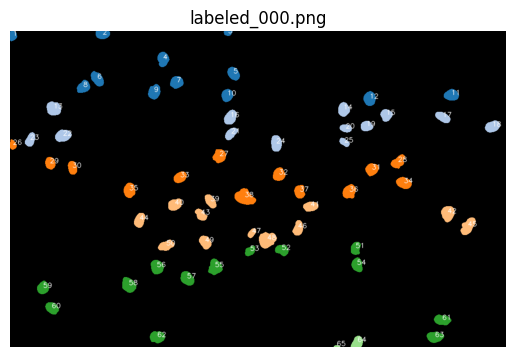

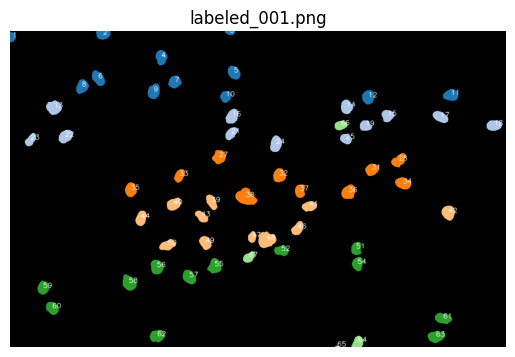

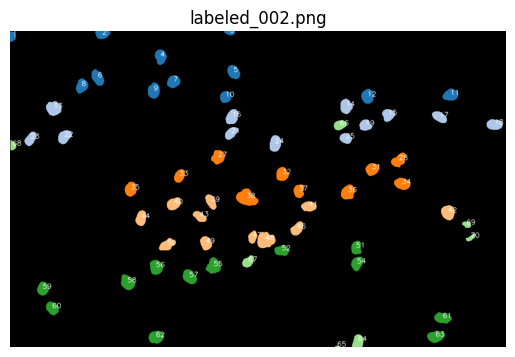

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

image_dir = "labeled_masks"
files = sorted([f for f in os.listdir(image_dir) if f.endswith(".png")])

# Show first 3 images
for fname in files[:3]:
    img = cv2.imread(os.path.join(image_dir, fname))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title(fname)
    plt.axis('off')
    plt.show()


In [ ]:
import numpy as np
import math

def extract_advanced_features(tracks, mitosis_events=[], pixel_size=1.0, frame_interval=1.0):
    mitosis_mothers = {m['mother_id'] for m in mitosis_events}
    mitosis_daughters = {d for m in mitosis_events for d in m['daughter_ids']}

    feature_table = []

    for track_id, detections in tracks.items():
        sizes = [d['area'] for d in detections]
        frames = [d['frame'] for d in detections]
        centroids = np.array([d['centroid'] for d in detections])

        speeds = []
        angles = []
        accelerations = []

        for i in range(1, len(centroids)):
            p1 = np.array(centroids[i - 1])
            p2 = np.array(centroids[i])
            dx, dy = p2[1] - p1[1], p2[0] - p1[0]

            dist = np.linalg.norm(p2 - p1)
            speed = (dist * pixel_size) / frame_interval
            speeds.append(speed)

            angle = math.degrees(math.atan2(-dy, dx)) % 360  # up is 90
            angles.append(angle)

        for i in range(1, len(speeds)):
            accel = (speeds[i] - speeds[i - 1]) / frame_interval
            accelerations.append(accel)

        feature_table.append({
            'id': track_id,
            'birth_frame': frames[0],
            'death_frame': frames[-1],
            'lifetime': len(frames),
            'mean_size': np.mean(sizes),
            'min_size': np.min(sizes),
            'max_size': np.max(sizes),
            'mean_speed': np.mean(speeds) if speeds else 0,
            'min_speed': np.min(speeds) if speeds else 0,
            'max_speed': np.max(speeds) if speeds else 0,
            'mean_acceleration': np.mean(accelerations) if accelerations else 0,
            'min_acceleration': np.min(accelerations) if accelerations else 0,
            'max_acceleration': np.max(accelerations) if accelerations else 0,
            'mean_angle': np.mean(angles) if angles else 0,
            'min_angle': np.min(angles) if angles else 0,
            'max_angle': np.max(angles) if angles else 0,
            'total_distance': np.sum(speeds) * frame_interval if speeds else 0,
            'mitosis_status': track_id in mitosis_mothers or track_id in mitosis_daughters,
            'role': ('mother' if track_id in mitosis_mothers else
                     'daughter' if track_id in mitosis_daughters else 'none')
        })

    return feature_table


In [ ]:
mitosis

[{'mother_id': 7, 'frame': 10, 'daughter_ids': [108, 110]},
 {'mother_id': 15, 'frame': 42, 'daughter_ids': [280, 283]},
 {'mother_id': 16, 'frame': 13, 'daughter_ids': [124, 125]},
 {'mother_id': 21, 'frame': 25, 'daughter_ids': [186, 187]},
 {'mother_id': 33, 'frame': 36, 'daughter_ids': [241, 242]},
 {'mother_id': 35, 'frame': 25, 'daughter_ids': [189, 190]},
 {'mother_id': 41, 'frame': 32, 'daughter_ids': [225, 226]},
 {'mother_id': 46, 'frame': 45, 'daughter_ids': [307, 308]},
 {'mother_id': 57, 'frame': 22, 'daughter_ids': [170, 171]},
 {'mother_id': 60, 'frame': 76, 'daughter_ids': [526, 527]},
 {'mother_id': 63, 'frame': 17, 'daughter_ids': [150, 151]},
 {'mother_id': 66, 'frame': 42, 'daughter_ids': [279, 282]},
 {'mother_id': 79, 'frame': 66, 'daughter_ids': [461, 462]},
 {'mother_id': 96, 'frame': 9, 'daughter_ids': [101, 102]},
 {'mother_id': 97, 'frame': 9, 'daughter_ids': [103, 104]},
 {'mother_id': 102, 'frame': 54, 'daughter_ids': [364, 365]},
 {'mother_id': 103, 'frame

In [ ]:
advanced_features = extract_advanced_features(tracks, mitosis)
save_features_to_csv(advanced_features, "cell_advanced_features.csv")

[✔] Cell features saved to: cell_advanced_features.csv


In [ ]:
pd.DataFrame(advanced_features)

,id,birth_frame,death_frame,lifetime,mean_size,min_size,max_size,mean_speed,min_speed,max_speed,mean_acceleration,min_acceleration,max_acceleration,mean_angle,min_angle,max_angle,total_distance,mitosis_status,role
0,1,0,10,11,247.636364,117.0,356.0,2.238346,0.669331,4.385152,0.138941,-2.442808,2.224533,206.341484,83.402739,313.221607,22.383460,False,none
1,2,0,74,75,398.946667,112.0,706.0,1.202445,0.170468,2.647578,0.006405,-2.124066,2.170175,174.162157,4.691875,357.031447,88.980896,False,none
2,3,0,7,8,167.750000,122.0,206.0,1.976974,0.427019,4.790972,-0.535075,-4.363952,0.790809,207.591182,9.974011,359.016413,13.838815,False,none
3,4,0,7,8,609.000000,207.0,680.0,2.905440,0.821611,5.616785,-0.140329,-3.575662,3.953201,111.835152,3.773316,253.722875,20.338079,False,none
4,5,0,9,10,667.100000,629.0,688.0,2.176376,0.328289,4.115779,-0.094830,-3.787490,2.219844,178.874375,68.501324,358.281645,19.587387,False,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643,644,91,91,1,133.000000,133.0,133.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False,none
644,645,91,91,1,199.000000,199.0,199.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False,none
645,646,91,91,1,231.000000,231.0,231.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False,none
646,647,91,91,1,194.000000,194.0,194.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False,none


In [ ]:
pd.DataFrame(advanced_features)["role"].value_counts()

,count
role,
none,521
daughter,83
mother,44
